In [49]:
import pandas as pd
import sqlite3 
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
import folium 
import folium.plugins as plugins
import branca.colormap as cm
%matplotlib inline

In [127]:
df = pd.read_csv('data/kc_house_data.csv')
df.to_sql('kc_house_sales', conn, if_exists='replace', index=False)
conn = sqlite3.connect('kings_county_housesales.db')
cur = conn.cursor()

In [128]:
q = """
SELECT *
FROM
    kc_house_sales
;
"""

king_county_df = pd.read_sql(q, conn)
king_county_df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,None,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,NO,NONE,...,8 Good,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,NO,NONE,...,8 Good,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,NO,NONE,...,7 Average,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,None,NONE,...,8 Good,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


In [136]:
king_county_df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,8 Good,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,8 Good,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,7 Average,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,0.0,0.0,...,8 Good,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


In [129]:
king_county_df.duplicated(subset='id').sum()

177

In [130]:
king_county_df = king_county_df.drop_duplicates(subset="id",keep="last")

In [131]:
king_county_df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [132]:
king_county_df['waterfront'].replace(('YES', 'NO'), (1, 0), inplace=True)

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\pandas\core\series.py:4563: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


In [133]:
king_county_df['waterfront'] = king_county_df['waterfront'].fillna(0)

<ipython-input-133-4094a6c7b361>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  king_county_df['waterfront'] = king_county_df['waterfront'].fillna(0)


In [134]:
king_county_df['view'].value_counts()

NONE         19253
AVERAGE        956
GOOD           505
FAIR           329
EXCELLENT      314
Name: view, dtype: int64

In [135]:
king_county_df['view'].replace(('NONE', 'AVERAGE', 'GOOD', 'FAIR', 'EXCELLENT'), (0, 2, 3, 1, 4), inplace=True)

In [87]:
king_county_df['sqft_living'].corr(king_county_df['price'])

0.7012948591175876

<AxesSubplot:>

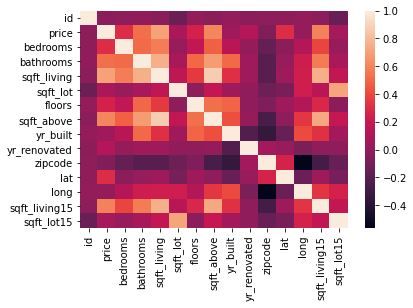

In [115]:
sns.heatmap(q_result.corr())

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


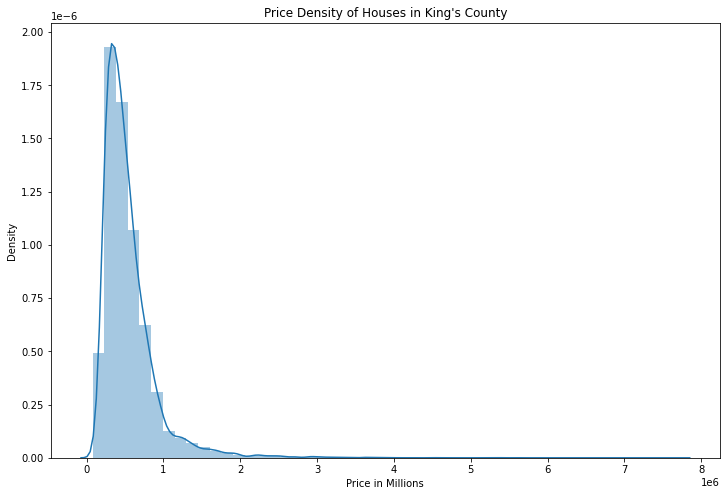

In [30]:
plt.figure(figsize=(12,8))

price_dist = sns.distplot(king_county_df["price"])
price_dist.set(xlabel="Price in Millions", title="Price Density of Houses in King's County")
plt.show()

In [58]:
logged_price = np.log(king_county_df["price"])

C:\Users\grego\anaconda3\envs\learn-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


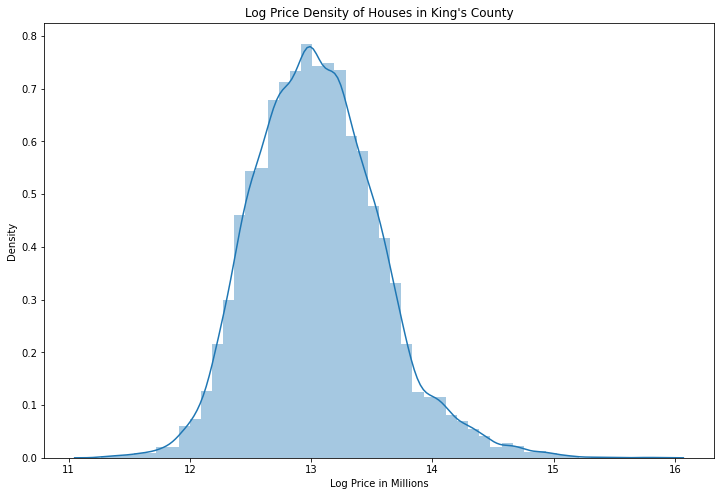

In [34]:
plt.figure(figsize=(12,8))

logged_price_dist = sns.distplot(np.log(king_county_df["price"]))
logged_price_dist.set(xlabel="Log Price in Millions", title="Log Price Density of Houses in King's County")
plt.show()

In [129]:
# create a LinearColorMap and assign colors, vmin, and vmax
# the colormap will show green for $100,000 homes all the way up to red for $1,500,000 homes
colormap = cm.LinearColormap(colors=['green', 'yellow', 'red'], vmin=100000, vmax=1500000)

In [130]:
king_county_map = folium.Map(location=[47.560093, -122.213982], zoom_start=10)

# go through each home in set, make circle, and add to map.
for i in range(len(king_county_df)):
    folium.Circle(
        location=[king_county_df.iloc[i]['lat'], king_county_df.iloc[i]['long']],
        radius=10,
        fill=True,
        color=colormap(king_county_df.iloc[i]['price']),
        fill_opacity=0.2
    ).add_to(king_county_map)
king_county_map.add_child(colormap)
# Same as before, we save it to file
king_county_map.save('circle_map.html')

In [131]:
king_county_map

In [89]:
king_county_df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [143]:
model = sm.formula.ols(formula=
'logged_price ~ bedrooms + bathrooms + view + sqft_above + sqft_living + sqft_living15 + sqft_lot15 + waterfront + lat + long + floors', 
data=king_county_df)
result = model.fit()
model_summary = result.summary()
model_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           logged_price   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     4736.
Date:                Tue, 04 Jan 2022   Prob (F-statistic):               0.00
Time:                        11:53:00   Log-Likelihood:                -3289.3
No. Observations:               21357   AIC:                             6603.
Df Residuals:                   21345   BIC:                             6698.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       -99.9151      1.966    -50.810      0.000    -103.770     -96.061
bedrooms         -0.0187      0.003     -7.091      0.000      -0.024      -0.014
bathrooms         0.0506      0.004     11.839      0.000       0.042       0.059
view              0.0820      0.003     27.785      0.000       0.076       0.088
sqft_above     1.743e-05   6.05e-06      2.881      0.004    5.57e-06    2.93e-05
sqft_living       0.0002   6.03e-06     39.486      0.000       0.000       0.000
sqft_living15     0.0002    4.6e-06     34.973      0.000       0.000       0.000
sqft_lot15     2.287e-07   7.49e-08      3.054      0.002    8.19e-08    3.75e-07
waterfront        0.3687      0.026     14.443      0.000       0.319       0.419
lat               1.5235      0.014    106.458      0.000       1.495       1.552
long             -0.3234      0.016    -20.511      0.000      -0.354      -0.293
floors            0.0418      0.005      8.658      0.000       0.032       0.051
==============================================================================
Omnibus:                      309.144   Durbin-Watson:                   2.010
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              590.126
Skew:                           0.014   Prob(JB):                    7.17e-129
Kurtosis:                       3.814   Cond. No.                     3.07e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.07e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [117]:
formula = 'logged_price ~ bedrooms + bathrooms + sqft_living + sqft_above + sqft_living15 + lat + long + floors	 + view + waterfront'
lm = ols(formula, king_county_df).fit()
table = sm.stats.anova_lm(lm, typ=2)
print(table)

                    sum_sq       df             F         PR(>F)
bedrooms          4.336535      1.0     54.378813   1.713683e-13
bathrooms        10.945530      1.0    137.253558   1.326283e-31
sqft_living     126.001014      1.0   1580.013768   0.000000e+00
sqft_above        0.733120      1.0      9.193099   2.432206e-03
sqft_living15    97.431945      1.0   1221.766470  2.407831e-260
lat             903.693917      1.0  11332.042399   0.000000e+00
long             32.871082      1.0    412.193203   8.792204e-91
floors            5.674884      1.0     71.161286   3.498301e-17
view             62.256138      1.0    780.672723  9.296913e-169
waterfront       16.628718      1.0    208.518981   4.817479e-47
Residual       1702.274812  21346.0           NaN            NaN
